<a href="https://colab.research.google.com/github/prachishete/DeepLearning/blob/main/CNN/DenoisingTechniques/01_Denoising_AutoEncoder.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Introduction**
#### In this series of experiments, we will see different techniques to remove the [Gaussian noise](https://en.wikipedia.org/wiki/Gaussian_noise#:~:text=Gaussian%20noise%2C%20named%20after%20Carl,known%20as%20the%20Gaussian%20distribution) from the image data
####In this 2nd experiment, we will calculate the [Peak signal-to-noise ratio (PSNR)](https://en.wikipedia.org/wiki/Peak_signal-to-noise_ratio) using a [CNN](https://en.wikipedia.org/wiki/Convolutional_neural_network) based [Autoencoder](https://en.wikipedia.org/wiki/Autoencoder).

#[Autoencoder](https://en.wikipedia.org/wiki/Autoencoder)
####An [Autoencoder](https://en.wikipedia.org/wiki/Autoencoder) is a type of artificial neural network used to learn efficient codings of unlabeled data (unsupervised learning). An autoencoder has two main parts: an encoder that maps the input into the code, and a decoder that maps the code to a reconstruction of the input. Autoencoders are typically forced to reconstruct the input approximately, preserving only the most relevant aspects of the data in the copy.
####Denoising autoencoder (DAE) take a partially corrupted input and are trained to recover the original undistorted input.
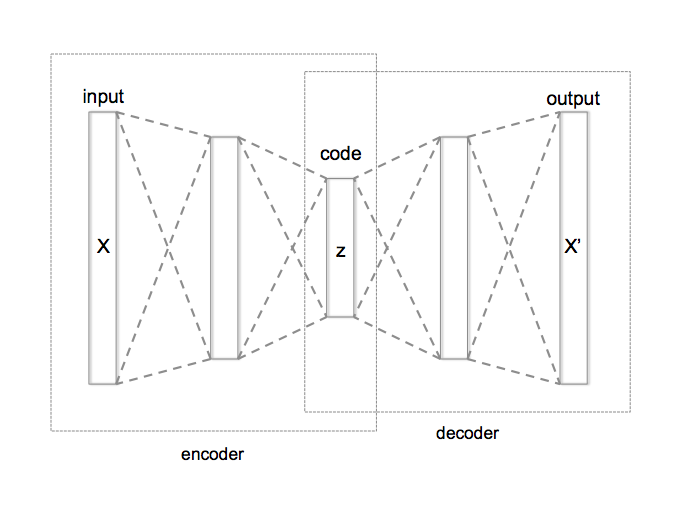


# **Download Dataset**
##[Medical Image Dataset](https://www.kaggle.com/datasets/parthplc/medical-image-dataset)
####The [Medical Image Dataset](https://www.kaggle.com/datasets/parthplc/medical-image-dataset) is available on Kaggle. This dataset consists of 120  dental X-rays images. We will split these images into Train (100 images), Validation (15 images) and Test (5 images).
####We will add [Gaussian noise](https://en.wikipedia.org/wiki/Gaussian_noise#:~:text=Gaussian%20noise%2C%20named%20after%20Carl,known%20as%20the%20Gaussian%20distribution) to these images and then apply the denoising technique to calculate the [PSNR](https://en.wikipedia.org/wiki/Peak_signal-to-noise_ratio).

In [ ]:
! pip install -q kaggle

In [ ]:
from google.colab import files
files.upload()

In [ ]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download parthplc/medical-image-dataset
! mkdir ~/medical-image-dataset
!unzip medical-image-dataset.zip -d medical-image-dataset

 38% 5.00M/13.0M [00:00<00:00, 51.7MB/s]
100% 13.0M/13.0M [00:00<00:00, 106MB/s] 
Archive:  medical-image-dataset.zip
  inflating: medical-image-dataset/Dataset/1.jpg  
  inflating: medical-image-dataset/Dataset/10.jpg  
  inflating: medical-image-dataset/Dataset/100.jpg  
  inflating: medical-image-dataset/Dataset/101.jpg  
  inflating: medical-image-dataset/Dataset/102.jpg  
  inflating: medical-image-dataset/Dataset/103.jpg  
  inflating: medical-image-dataset/Dataset/104.jpg  
  inflating: medical-image-dataset/Dataset/105.jpg  
  inflating: medical-image-dataset/Dataset/106.jpg  
  inflating: medical-image-dataset/Dataset/107.jpg  
  inflating: medical-image-dataset/Dataset/108.jpg  
  inflating: medical-image-dataset/Dataset/109.jpg  
  inflating: medical-image-dataset/Dataset/11.jpg  
  inflating: medical-image-dataset/Dataset/110.jpg  
  inflating: medical-image-dataset/Dataset/111.jpg  
  inflating: medical-image-dataset/Dataset/112.jpg  
  inflating: medical-image-dataset/Dat

# **Import the libraries**
#### We will set the seed so that the initial random values set in the experiment will be same throughout the series. This will help in comparing the outputs as we will move from one experiment to next

In [ ]:
import random
import numpy as np
import tensorflow as tf

seed=7
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)
#tf.config.experimental.enable_op_determinism()

# **Create training and testing arrays**

In [ ]:
import os
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, array_to_img, img_to_array
import cv2
from math import log10,sqrt

In [ ]:
def convert_images_to_array(images_folder, test=False):
    images = []
    for img_dir in images_folder:
        image = load_img(img_dir, color_mode='grayscale', target_size=(258, 540, 1))
        image = img_to_array(image).astype('float32') / 255.0
        images.append(image)
    return np.asarray(images)

In [ ]:
root_dir = '/content/medical-image-dataset/Dataset'
os.chdir(root_dir)

In [ ]:
train_images = sorted(os.listdir(root_dir))
X_train_full = convert_images_to_array(train_images)

In [ ]:
X_train_full.shape

(120, 258, 540, 1)

# **Add [Gaussian noise](https://en.wikipedia.org/wiki/Gaussian_noise#:~:text=Gaussian%20noise%2C%20named%20after%20Carl,known%20as%20the%20Gaussian%20distribution) to image dataset**

In [ ]:
def add_noise(image,mean,sigma):
    row,col,ch= image.shape
    gauss = np.random.normal(mean,sigma,(row,col,ch))
    gauss = gauss.reshape(row,col,ch)
    noisy_img = image + gauss*0.3
    return noisy_img

In [ ]:
X_noised_full= []

for img in X_train_full:
    noisy_img= add_noise(img,0,1) #Mean 0 and sigma 1 for the Gaussian noise
    X_noised_full.append(noisy_img)

In [ ]:
X_noised_full= np.array(X_noised_full)

In [ ]:
X_noised_full.shape

(120, 258, 540, 1)

# **Visualize original & noisy images**

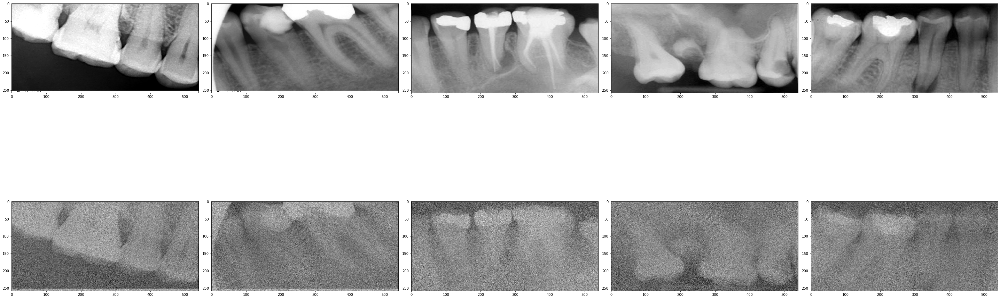

In [ ]:
f, ax = plt.subplots(2, 5)
f.set_size_inches(40, 20)
for i in range(5):
        ax[0][i].imshow(np.reshape(X_train_full[i], (258, 540)), cmap='gray')
        ax[1][i].imshow(np.reshape(X_noised_full[i], (258, 540)), cmap='gray')
            
plt.tight_layout()


In [ ]:
def show_img(dataset):
    f, ax = plt.subplots(1,5)
    f.set_size_inches(40, 20)
    for i in range(5,10):
        ax[i-5].imshow(dataset[i].reshape(258, 540), cmap='gray')
    plt.show()

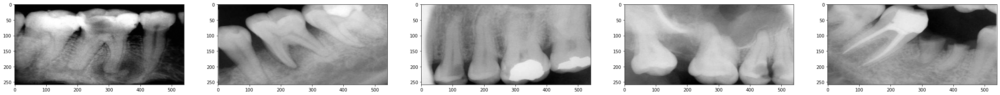

In [ ]:
show_img(X_train_full)

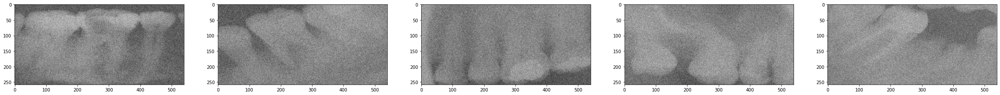

In [ ]:
show_img(X_noised_full)

# **Split the training set into train , validation and test set**

In [ ]:
X_train= X_noised_full[0:100]
X_val= X_noised_full[100:115]
X_test=X_noised_full[115:]

X_train_original= X_train_full[0:100]
X_val_original= X_train_full[100:115]
X_test_original=X_train_full[115:]

In [ ]:
X_train, Y_train = X_train, X_train_original 
X_val, Y_val = X_val,X_val_original 

In [ ]:
print(X_train.shape)
print(X_val.shape)
print(X_test.shape)

(100, 258, 540, 1)
(15, 258, 540, 1)
(5, 258, 540, 1)


# **Import Libraries for CNN based Autoencoder**

In [ ]:
import tensorflow as tf
from tensorflow import keras

from keras.models import Model
from keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Input, BatchNormalization
from tensorflow.keras import regularizers

# **Defining the CNN based Autoencoder**

In [ ]:
input_image = Input(shape=(None,None,1), name='input-image')
reg = regularizers.L1( l1=5e-7)    
#encoder 
x = Conv2D(32, (3,3), activation='relu', padding='same', name='Conv1')(input_image)
x = BatchNormalization()(x)
x = Conv2D(64, (3,3), activation='relu', padding='same', name='Conv2')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2,2), padding='same', name='pool1')(x)

#decoder
x = Conv2D(64, (3,3), activation='relu', padding='same', name='Conv3')(x)
x = BatchNormalization()(x)
x = Conv2D(32, (3,3), activation='relu', padding='same', name='Conv4')(x)
x = BatchNormalization()(x)
x = UpSampling2D((2,2), name='upsample2')(x)
output_image = Conv2D(1, (3,3), activation='sigmoid', padding='same', name='Conv5')(x)
    
#model
autoencoder = Model(inputs=input_image, outputs=output_image)

autoencoder.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input-image (InputLayer)    [(None, None, None, 1)]   0         
                                                                 
 Conv1 (Conv2D)              (None, None, None, 32)    320       
                                                                 
 batch_normalization (BatchN  (None, None, None, 32)   128       
 ormalization)                                                   
                                                                 
 Conv2 (Conv2D)              (None, None, None, 64)    18496     
                                                                 
 batch_normalization_1 (Batc  (None, None, None, 64)   256       
 hNormalization)                                                 
                                                                 
 pool1 (MaxPooling2D)        (None, None, None, 64)    0     

In [ ]:
autoencoder.compile(optimizer='adam', loss='mse', metrics=['mae'])

In [ ]:
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_mae', patience=7, verbose=1, factor=0.1, min_lr=0.00001)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_mae', patience=20, restore_best_weights=True, verbose=1, mode='auto')
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="./logs")

In [ ]:
epochs = 500
batch_size = 2

In [ ]:
history = autoencoder.fit(X_train, Y_train, validation_data=(X_val, Y_val), 
                   batch_size=batch_size, epochs=epochs, shuffle=True,
                   callbacks=[reduce_lr, early_stopping, tensorboard_callback]
                   )

Epoch 1/500
50/50 [==============================] - 15s 65ms/step - loss: 0.0153 - mae: 0.0893 - val_loss: 0.0371 - val_mae: 0.1499 - lr: 0.0010
Epoch 2/500
50/50 [==============================] - 2s 37ms/step - loss: 0.0063 - mae: 0.0618 - val_loss: 0.0334 - val_mae: 0.1462 - lr: 0.0010
Epoch 3/500
50/50 [==============================] - 2s 38ms/step - loss: 0.0058 - mae: 0.0594 - val_loss: 0.0198 - val_mae: 0.1106 - lr: 0.0010
Epoch 4/500
50/50 [==============================] - 2s 39ms/step - loss: 0.0055 - mae: 0.0570 - val_loss: 0.0099 - val_mae: 0.0769 - lr: 0.0010
Epoch 5/500
50/50 [==============================] - 2s 37ms/step - loss: 0.0060 - mae: 0.0598 - val_loss: 0.0087 - val_mae: 0.0697 - lr: 0.0010
Epoch 6/500
50/50 [==============================] - 2s 39ms/step - loss: 0.0051 - mae: 0.0543 - val_loss: 0.0091 - val_mae: 0.0793 - lr: 0.0010
Epoch 7/500
50/50 [==============================] - 2s 37ms/step - loss: 0.0049 - mae: 0.0544 - val_loss: 0.0117 - val_mae: 0.09

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
val_loss, val_mae = autoencoder.evaluate(X_val, Y_val, verbose=1)
print("Validation loss: {0:.4f} and mae: {1:.4f}".format(val_loss, val_mae))

1/1 [==============================] - 2s 2s/step - loss: 0.0013 - mae: 0.0263
Validation loss: 0.0013 and mae: 0.0263


In [ ]:
pred= autoencoder.predict(X_test)

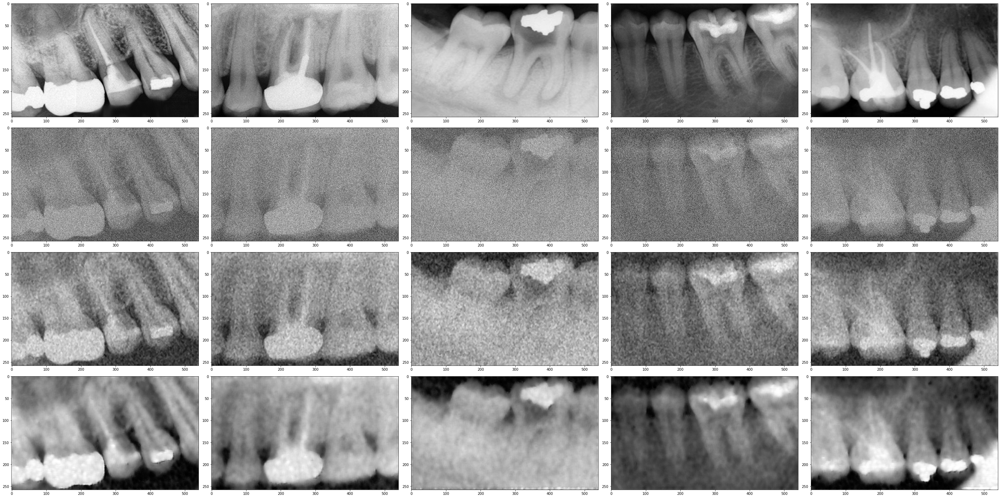

In [ ]:
f, ax = plt.subplots(4, 5)
f.set_size_inches(40, 20)
for i in range(5):
        ax[0][i].imshow(np.reshape(X_train_full[115+i], (258, 540)), aspect='auto', cmap='gray')
        ax[1][i].imshow(np.reshape(X_test[i], (258, 540)), aspect='auto', cmap='gray')
        ax[2][i].imshow(np.reshape(cv2.medianBlur(X_test[i].astype('float32'), (5)), (258, 540)), aspect='auto', cmap='gray')
        ax[3][i].imshow(np.reshape(pred[i], (258, 540)), aspect='auto', cmap='gray')
            
plt.tight_layout()

# **Calculate [PSNR](https://en.wikipedia.org/wiki/Peak_signal-to-noise_ratio)**
Peak signal-to-noise ratio ([PSNR](https://en.wikipedia.org/wiki/Peak_signal-to-noise_ratio)) is an engineering term for the ratio between the maximum possible power of a signal and the power of corrupting noise that affects the fidelity of its representation. Because many signals have a very wide dynamic range, PSNR is usually expressed as a logarithmic quantity using the decibel scale.

[PSNR](https://en.wikipedia.org/wiki/Peak_signal-to-noise_ratio) is commonly used to quantify reconstruction quality for images and video subject to lossy compression.

The PSNR (in dB) is defined as

\begin{aligned}{\mathit {PSNR}}&=10\cdot \log _{10}\left({\frac {{\mathit {MAX}}_{I}^{2}}{\mathit {MSE}}}\right)\\&=20\cdot \log _{10}\left({\frac {{\mathit {MAX}}_{I}}{\sqrt {\mathit {MSE}}}}\right)\\&=20\cdot \log _{10}({\mathit {MAX}}_{I})-10\cdot \log _{10}({\mathit {MSE}}).\end{aligned} 

In [ ]:
def PSNR(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal .
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

In [ ]:
psnr = 0
for img in range(X_test.shape[0]):
    psnr = psnr + PSNR(X_test_original[img], pred[img]) 
    
psnr_final = psnr / X_test.shape[0]
print(psnr_final)

76.5138287824899


# **Conclusion**
####With the help of [CNN](https://en.wikipedia.org/wiki/Convolutional_neural_network) based [Autoencoder](https://en.wikipedia.org/wiki/Autoencoder), we could achieve the PSNR value as 76.5 dB which is higher than the value achieved by [Median filter](https://en.wikipedia.org/wiki/Median_filter#:~:text=The%20median%20filter%20is%20a,edge%20detection%20on%20an%20image) (70 dB).